# Effect of Road Irregularities on Fuel consumption and Potholes

In [1]:
#Importing the necessary libraries

import pandas as pd
import numpy as np
import sys
from matplotlib import pyplot as plt
%matplotlib inline
from sklearn.cluster import KMeans
import math
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from IPython.display import Image
from sklearn.metrics import silhouette_score
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.model_selection import cross_validate
import seaborn as sns

In [2]:
#Importing the datasets

df = pd.read_csv("car_data2.csv",low_memory=False)
highway_data = pd.read_csv("highway.csv",low_memory=False)

In [3]:
df.head()

,GPS Time,Device Time,Longitude,Latitude,GPS Speed (Meters/second),Horizontal Dilution of Precision,Altitude,Bearing,G(x),G(y),...,GPS Satellites,Intake Air Temperature(°C),Intake Manifold Pressure(psi),Mass Air Flow Rate(g/s),Speed (GPS)(km/h),Speed (OBD)(km/h),Throttle Position(Manifold)(%),Torque(Nm),Trip Distance(km),Image_label
0,Sat Aug 28 16:55:28 CST 2021,28-Aug.-2021 16:55:27.076,-104.598306,50.415425,0.0,3.790093,561.596680,0.0,-0.873978,0.084945,...,16,38,3.625943,0,0.0,0,16.862745,-0.0,-0.0,0
1,Sat Aug 28 16:55:28 CST 2021,28-Aug.-2021 16:55:27.539,-104.598306,50.415425,0.0,3.790093,561.596680,0.0,-0.954138,0.101695,...,16,38,3.625943,0,0.0,0,17.254902,-0.0,-0.0,0
2,Sat Aug 28 16:55:29 CST 2021,28-Aug.-2021 16:55:28.037,-104.598306,50.415425,0.0,3.790093,561.596191,0.0,-0.932603,0.046660,...,17,38,6.961812,0,0.0,0,17.254902,-0.0,-0.0,0
3,Sat Aug 28 16:55:29 CST 2021,28-Aug.-2021 16:55:28.533,-104.598306,50.415425,0.0,3.790093,561.596191,0.0,-0.872782,0.155533,...,17,38,6.961812,0,0.0,0,17.254902,-0.0,-0.0,0
4,Sat Aug 28 16:55:30 CST 2021,28-Aug.-2021 16:55:29.033,-104.598306,50.415425,0.0,3.790093,561.592163,0.0,-0.940978,0.171087,...,17,38,4.061057,0,0.0,0,17.254902,-0.0,-0.0,0


In [4]:
highway_data.head()

,GPS Time,Device Time,Longitude,Latitude,GPS Speed (Meters/second),Horizontal Dilution of Precision,Altitude,Bearing,G(x),G(y),...,GPS Longitude(°),GPS Satellites,Intake Air Temperature(°C),Intake Manifold Pressure(psi),Mass Air Flow Rate(g/s),Speed (GPS)(km/h),Speed (OBD)(km/h),Throttle Position(Manifold)(%),Torque(Nm),Trip Distance(km)
0,Sun Aug 29 15:03:04 CST 2021,29-Aug.-2021 15:03:03.152,-104.532452,50.447408,12.52,4.070510,557.895508,93.7,-0.848854,-0.104088,...,-104.532455,14,57,12.908359,0,45.071999,45,32.549019,-0.000000,0.484347
1,Sun Aug 29 15:03:05 CST 2021,29-Aug.-2021 15:03:03.614,-104.532270,50.447411,13.24,4.069856,558.063232,86.0,-0.352044,-0.148355,...,-104.532272,14,57,12.908359,0,47.663998,45,32.941177,-0.000000,0.484347
2,Sun Aug 29 15:03:05 CST 2021,29-Aug.-2021 15:03:04.114,-104.532270,50.447411,13.24,4.069856,558.063232,86.0,0.612862,-0.384347,...,-104.532272,14,57,13.053396,0,47.663998,49,32.941177,66.950638,0.496842
3,Sun Aug 29 15:03:06 CST 2021,29-Aug.-2021 15:03:04.612,-104.532075,50.447419,13.99,3.888164,558.264160,86.2,0.205783,-0.220140,...,-104.532074,14,57,13.053396,0,50.363998,49,37.647060,66.950638,0.496842
4,Sun Aug 29 15:03:06 CST 2021,29-Aug.-2021 15:03:05.113,-104.532075,50.447419,13.99,3.888164,558.264160,86.2,0.314955,0.263211,...,-104.532074,14,57,13.488509,0,50.363998,49,37.647060,66.950638,0.496842


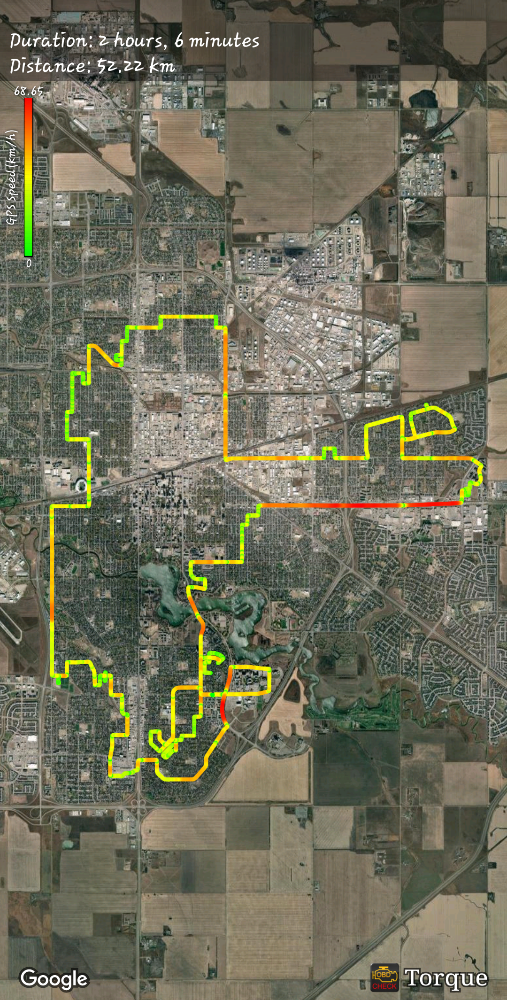

In [5]:
#Trip route for the city dataset

Image(filename='trip_image.jpg', width = 400, height = 300) 

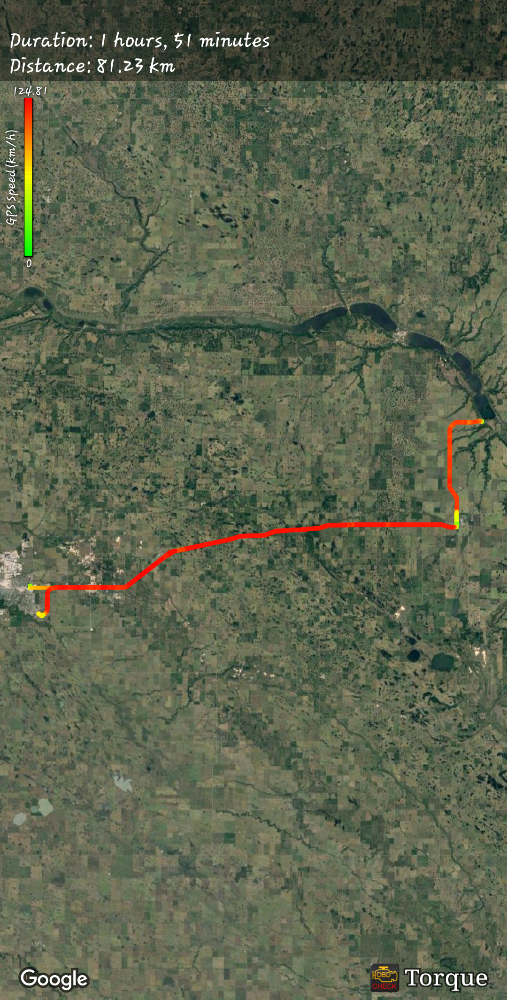

In [6]:
#Trip route for the highway dataset

Image(filename='highway_trip.jpg', width = 400, height = 300) 

In [7]:
df.shape

(14899, 39)

In [8]:
#Checking the Acccelerometer Z values

np.amax(df.AccZ)

0.56253278

In [9]:
#Checking the Acccelerometer Z values

np.amin(df.AccZ)

-0.35328281

In [10]:
#Checking the Acccelerometer Z values

np.amax(highway_data.AccZ)

0.5369826

In [11]:
#Checking the Acccelerometer Z values

np.amin(highway_data.AccZ)

-0.46847242

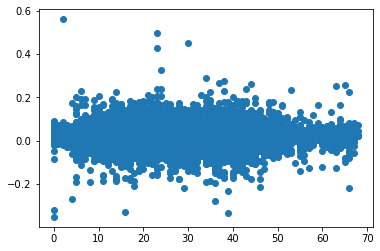

In [12]:
#Scatter plot for the Accelerometer Z values for city data

plt.scatter(df['Speed (OBD)(km/h)'],df['AccZ'])

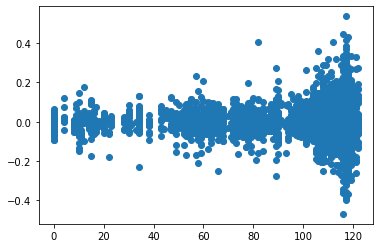

In [13]:
#Scatter plot for the Accelerometer Z values for Highway data

plt.scatter(highway_data['Speed (OBD)(km/h)'],highway_data['AccZ'])

In [14]:
df.columns

Index(['GPS Time', 'Device Time', 'Longitude', 'Latitude',
       'GPS Speed (Meters/second)', ' Horizontal Dilution of Precision',
       ' Altitude', ' Bearing', ' G(x)', ' G(y)', ' G(z)', ' G(calibrated)',
       ' Absolute Throttle Position B(%)', 'AccX', 'AccY', 'AccZ',
       'Actual engine % torque(%)', 'Air Fuel Ratio', 'Ambient air temp(°C)',
       'Barometric pressure (from vehicle)(psi)', 'CO₂ in g/km (Average)',
       'CO₂ in g/km (Instantaneous)', 'Engine Coolant Temperature(°C)',
       'Engine Load(%)', 'Engine Load(Absolute)(%)', 'Engine RPM',
       'Fuel used (trip)(gal)', 'GPS Latitude(°)', 'GPS Longitude(°)',
       'GPS Satellites', 'Intake Air Temperature(°C)',
       'Intake Manifold Pressure(psi)', 'Mass Air Flow Rate(g/s)',
       'Speed (GPS)(km/h)', 'Speed (OBD)(km/h)',
       'Throttle Position(Manifold)(%)', 'Torque(Nm)', 'Trip Distance(km)',
       'Image_label'],
      dtype='object')

In [15]:
highway_data.columns

Index(['GPS Time', 'Device Time', 'Longitude', ' Latitude',
       'GPS Speed (Meters/second)', ' Horizontal Dilution of Precision',
       ' Altitude', ' Bearing', ' G(x)', ' G(y)', ' G(z)', ' G(calibrated)',
       ' Absolute Throttle Position B(%)', 'AccX', 'AccY', 'AccZ',
       'Actual engine % torque(%)', 'Air Fuel Ratio', 'Ambient air temp(°C)',
       'Barometric pressure (from vehicle)(psi)', 'CO₂ in g/km (Average) ',
       'CO₂ in g/km (Instantaneous)', 'Engine Coolant Temperature(°C)',
       'Engine Load(%)', 'Engine Load(Absolute)(%)', 'Engine RPM',
       'Fuel used (trip)(gal)', 'GPS Latitude(°)', 'GPS Longitude(°)',
       'GPS Satellites', 'Intake Air Temperature(°C)',
       'Intake Manifold Pressure(psi)', 'Mass Air Flow Rate(g/s)',
       'Speed (GPS)(km/h)', 'Speed (OBD)(km/h)',
       'Throttle Position(Manifold)(%)', 'Torque(Nm)', 'Trip Distance(km)'],
      dtype='object')

## Clustering Process to group the data

In [16]:
#Removing the string values from the city data that are not required for clustering

df = df.drop(['GPS Time','Device Time'], axis = 1)

In [17]:
#Elbow Method to find the optimal K value

k_rng = range(1,10)
sse = []
for k in k_rng:
    km=KMeans(n_clusters=k)
    km.fit(df)
    sse.append(km.inertia_)
sse

[2789526935.0561476,
 1528110788.9718766,
 902146677.8427054,
 697591845.9768943,
 569830856.7315505,
 492683623.8399991,
 417903941.44996,
 371166871.6642398,
 347446790.37214345]

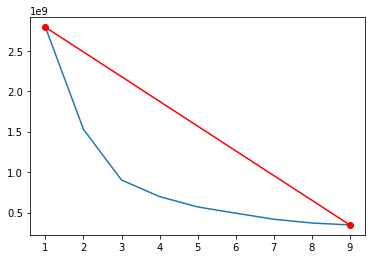

In [18]:
# Plotting the sum of squared errors

plt.plot(k_rng,sse)
plt.plot([k_rng[0], k_rng[8]], [sse[0], sse[8]], 'ro-')
plt.show()

In [19]:
#Calculating the distance from each K value to the straight line: Greater the distance, optimmal the K value

def distance(x,y,a,b,c):
    d = abs((a*x + b*y + c)) / (math.sqrt(a*a + b*b))
    return d
a = sse[0] - sse[8]
b = k_rng[8] - k_rng[0]
c1 = k_rng[0] * sse[8]
c2 = k_rng[8] * sse[0]
c = c1-c2

distance_from_line = []
for k in range(9):
    distance_from_line.append(distance(k_rng[k], sse[k], a,b,c))
optimum_k = str(distance_from_line.index(max(distance_from_line))+1)
optimum_k

'3'

In [20]:
# Silhouette Score to determine the K value

for n_clusters in range(3,10):
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df)
    silhouette_avg = silhouette_score(df, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

For n_clusters = 3 The average silhouette_score is : 0.4885945109514032
For n_clusters = 4 The average silhouette_score is : 0.5058229919399961
For n_clusters = 5 The average silhouette_score is : 0.4621830245071764
For n_clusters = 6 The average silhouette_score is : 0.43841660765474316
For n_clusters = 7 The average silhouette_score is : 0.35905891842596493
For n_clusters = 8 The average silhouette_score is : 0.35894059373925846
For n_clusters = 9 The average silhouette_score is : 0.3615330862389216


In [21]:
# KMeans Clustering done on Accelerometer Z values

k=4
km = KMeans(n_clusters=k, random_state=300)
km_model = km.fit(df[['AccZ']])
y_pred = km.predict(df[['AccZ']])

In [22]:
#Code to sort the same values for cluster all the time and adding a 'Cluster' column to the dataset

idx1 = np.argsort(km.cluster_centers_.sum(axis=1))
lut1 = np.zeros_like(idx1)
lut1[idx1] = np.arange(k)
lut1[km.labels_]
df['cluster'] = lut1[km.labels_]

[[ 0.04092342]
 [ 0.0051384 ]
 [ 0.11006417]
 [-0.05830656]]


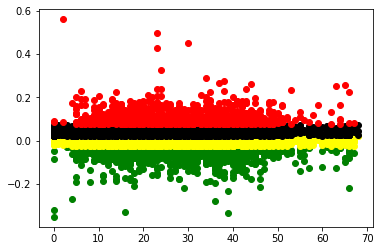

In [23]:
#Plotting different clusters and printing the cluster centers

df1 = df[df.cluster==0]
df2 = df[df.cluster==1]
df3 = df[df.cluster==2]
df4 = df[df.cluster==3]

plt.scatter(df1['Speed (OBD)(km/h)'],df1['AccZ'], color = 'green')
plt.scatter(df2['Speed (OBD)(km/h)'],df2['AccZ'], color = 'yellow')
plt.scatter(df3['Speed (OBD)(km/h)'],df3['AccZ'], color = 'black')
plt.scatter(df4['Speed (OBD)(km/h)'],df4['AccZ'], color = 'red')

print((km.cluster_centers_))

In [24]:
#Creating a new 'Pothole' column and grouping the data to 'Big Pothole','Medium Pothole','Small bump','Heavy bump' based on the cluster values

df['Pothole'] = ["Big Pothole" if i==0 else "Medium pothole" if i==1 else "Small bump" if i==2 else "Heavy bump" for i in df.cluster]
df.head()


,Longitude,Latitude,GPS Speed (Meters/second),Horizontal Dilution of Precision,Altitude,Bearing,G(x),G(y),G(z),G(calibrated),...,Intake Manifold Pressure(psi),Mass Air Flow Rate(g/s),Speed (GPS)(km/h),Speed (OBD)(km/h),Throttle Position(Manifold)(%),Torque(Nm),Trip Distance(km),Image_label,cluster,Pothole
0,-104.598306,50.415425,0.0,3.790093,561.596680,0.0,-0.873978,0.084945,9.478270,0.023607,...,3.625943,0,0.0,0,16.862745,-0.0,-0.0,0,2,Small bump
1,-104.598306,50.415425,0.0,3.790093,561.596680,0.0,-0.954138,0.101695,9.533304,0.024865,...,3.625943,0,0.0,0,17.254902,-0.0,-0.0,0,1,Medium pothole
2,-104.598306,50.415425,0.0,3.790093,561.596191,0.0,-0.932603,0.046660,9.593125,0.024018,...,6.961812,0,0.0,0,17.254902,-0.0,-0.0,0,1,Medium pothole
3,-104.598306,50.415425,0.0,3.790093,561.596191,0.0,-0.872782,0.155533,9.401699,0.022572,...,6.961812,0,0.0,0,17.254902,-0.0,-0.0,0,2,Small bump
4,-104.598306,50.415425,0.0,3.790093,561.592163,0.0,-0.940978,0.171087,9.534501,0.023646,...,4.061057,0,0.0,0,17.254902,-0.0,-0.0,0,2,Small bump


In [25]:
#Checking the Correlation matrix of the dataset to get more insights

df.corr()

,Longitude,Latitude,GPS Speed (Meters/second),Horizontal Dilution of Precision,Altitude,Bearing,G(x),G(y),G(z),G(calibrated),...,Intake Air Temperature(°C),Intake Manifold Pressure(psi),Mass Air Flow Rate(g/s),Speed (GPS)(km/h),Speed (OBD)(km/h),Throttle Position(Manifold)(%),Torque(Nm),Trip Distance(km),Image_label,cluster
Longitude,1.000000,0.238638,0.145540,-0.119124,0.766335,-0.010076,0.065867,-0.071615,0.014874,-0.006912,...,-0.023071,0.029530,NaN,0.145540,0.144860,0.048443,0.034313,0.404759,0.022182,0.023443
Latitude,0.238638,1.000000,-0.015147,0.077689,0.245916,-0.133333,-0.007450,0.042948,0.012679,-0.026046,...,0.332562,-0.041752,NaN,-0.015147,-0.014911,-0.026575,0.005967,0.013468,-0.008872,-0.008510
GPS Speed (Meters/second),0.145540,-0.015147,1.000000,-0.057807,0.078783,0.267759,-0.019777,-0.121276,-0.001238,-0.057070,...,-0.062729,0.048444,NaN,1.000000,0.995214,0.138451,0.270337,0.052176,-0.044915,0.020321
Horizontal Dilution of Precision,-0.119124,0.077689,-0.057807,1.000000,-0.125734,0.002138,-0.006722,0.032947,-0.011478,-0.000100,...,-0.014884,0.000620,NaN,-0.057807,-0.055761,-0.005672,-0.013411,-0.076918,-0.005664,-0.020729
Altitude,0.766335,0.245916,0.078783,-0.125734,1.000000,-0.125177,0.064333,-0.060010,0.032463,-0.005525,...,0.172188,0.004094,NaN,0.078783,0.078346,0.013007,0.017701,0.518770,0.021633,0.029182
Bearing,-0.010076,-0.133333,0.267759,0.002138,-0.125177,1.000000,0.057136,-0.000340,-0.009879,0.014089,...,-0.057185,0.061356,NaN,0.267759,0.267113,0.120067,0.119401,0.021005,-0.007196,0.015545
G(x),0.065867,-0.007450,-0.019777,-0.006722,0.064333,0.057136,1.000000,-0.012723,0.170744,-0.070016,...,0.201862,-0.063442,NaN,-0.019777,-0.021560,-0.042610,-0.024002,0.247487,0.012568,0.142535
G(y),-0.071615,0.042948,-0.121276,0.032947,-0.060010,-0.000340,-0.012723,1.000000,-0.039918,-0.052542,...,0.005490,0.657939,NaN,-0.121276,-0.087714,0.598035,0.246114,-0.082528,-0.033448,-0.006714
G(z),0.014874,0.012679,-0.001238,-0.011478,0.032463,-0.009879,0.170744,-0.039918,1.000000,0.374432,...,0.048457,-0.005635,NaN,-0.001238,-0.001960,-0.010426,-0.002216,0.063830,-0.027877,0.226498
G(calibrated),-0.006912,-0.026046,-0.057070,-0.000100,-0.005525,0.014089,-0.070016,-0.052542,0.374432,1.000000,...,0.009078,0.028490,NaN,-0.057070,-0.056911,0.062793,-0.008875,0.017346,-0.057364,0.371578


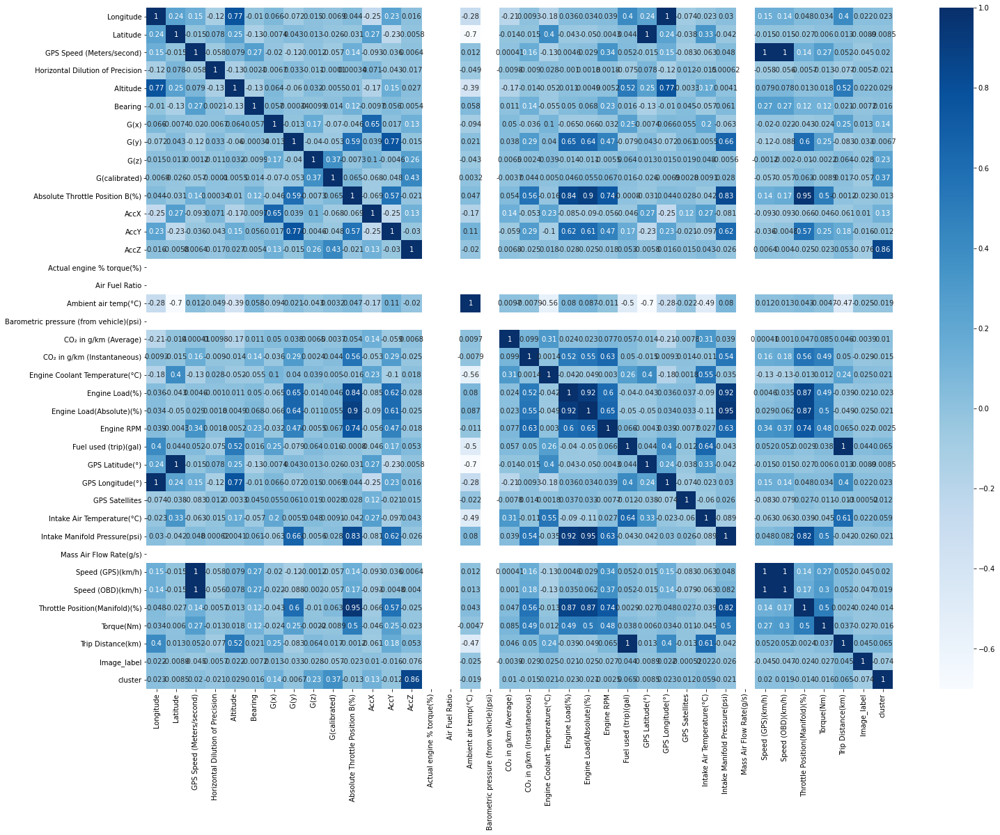

In [26]:
#Plotting the Correlation matrix

plt.figure(figsize = (24,18))
sns.heatmap(df.corr(), annot=True, cmap = plt.cm.Blues)
plt.savefig("corr_matrix.png", dpi=500)

## Classification algorithms to predict any new data

In [27]:
#Removing the string values to create classifier algorithm models

df1 = df.drop(['Pothole'] , axis = 1)

In [28]:
#Defining the training and testing datasets

y1 = df1['Image_label']
X1 = df1.drop(['Image_label'], axis= 1)

#Splitting the data

X_train, X_test, y_train, y_test = train_test_split(X1,y1, test_size = 0.3, random_state = 300)

In [29]:
#Random Forest Classifier

%time
rf = RandomForestClassifier(max_depth = 200, random_state = 300)
rf_model = rf.fit(X_train, y_train)
y_predict = rf.predict(X_test)

print('Accuracy Score is {:.2}'.format(accuracy_score(y_test, y_predict)))

print('F1-Score is {:.2}'.format(f1_score(y_test, y_predict, average='weighted')))

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 3.81 µs
Accuracy Score is 1.0
F1-Score is 1.0


In [30]:
#Checking the weightaige of all columns went in to train the model

features_importance = rf_model.feature_importances_
print("Feature ranking:")
for i, data_class in enumerate(features_importance):
    print("{}. {}".format(i + 1, data_class, features_importance[i]))

Feature ranking:
1. 0.04290121967867136
2. 0.019055406618551214
3. 0.045607211079015456
4. 0.01985118305430473
5. 0.03537513322319009
6. 0.032623805158254915
7. 0.02646507978710761
8. 0.04047571388624781
9. 0.030531584679017794
10. 0.05652721446035953
11. 0.01727184246071638
12. 0.025331584457646838
13. 0.028797735842862947
14. 0.08966141769192414
15. 0.0
16. 0.0
17. 0.005677451626705156
18. 0.0
19. 0.02629009054447613
20. 0.0132868963207991
21. 0.009497267302311941
22. 0.027990155628773373
23. 0.023324188424833515
24. 0.03260432042713994
25. 0.052584838105443794
26. 0.038486244578668824
27. 0.03100231842003752
28. 0.01891367972283423
29. 0.013067526603282933
30. 0.02915986011019118
31. 0.0
32. 0.043140914253863405
33. 0.029287653643479926
34. 0.010258170239556967
35. 0.014950557017654456
36. 0.04704796948840256
37. 0.022953765463674256


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     14865
           1       1.00      0.79      0.89        34

    accuracy                           1.00     14899
   macro avg       1.00      0.90      0.94     14899
weighted avg       1.00      1.00      1.00     14899



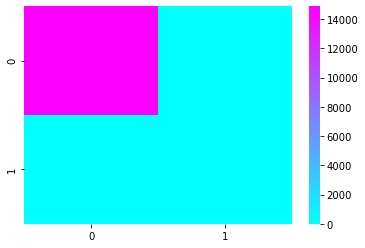

,0,1
0,14865,0
1,7,27


In [31]:
#Confusion matrix analysis code to check for missclassification rate for the Random Forest model

def con_matrix_analysis(rf):
  x = rf_model.predict(X1)
  y = y1
  
  print(classification_report(y, x,
        target_names=['0','1']))

  con_matrix = pd.DataFrame(confusion_matrix(y, x), 
             columns=['0','1'], 
             index=['0','1'])
                            
  sns.heatmap(data=con_matrix, cmap='cool')
  plt.show()
  return con_matrix

con_matrix_analysis(rf_model)

In [32]:
#K Nearest Neighbour Classifier

%time
knn = KNeighborsClassifier(n_neighbors=1)
knn_model = knn.fit(X_train, y_train)
pred = knn.predict(X_test)

print('Accuracy Score is {:.2}'.format(accuracy_score(y_test, pred)))

print('F1-Score is {:.2}'.format(f1_score(y_test, pred, average='weighted')))

CPU times: user 1 µs, sys: 0 ns, total: 1 µs
Wall time: 3.81 µs
Accuracy Score is 1.0
F1-Score is 1.0


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     14865
           1       0.64      0.79      0.71        34

    accuracy                           1.00     14899
   macro avg       0.82      0.90      0.85     14899
weighted avg       1.00      1.00      1.00     14899



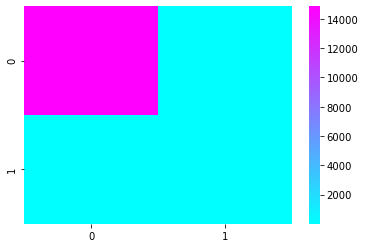

,0,1
0,14850,15
1,7,27


In [33]:
#Confusion matrix analysis code to check for missclassification rate for the KNN model

def con_matrix_analysis(knn):
  x = knn_model.predict(X1)
  y = y1
  
  print(classification_report(y, x,
        target_names=['0','1']))

  con_matrix = pd.DataFrame(confusion_matrix(y, x), 
             columns=['0','1'], 
             index=['0','1'])
                            
  sns.heatmap(data=con_matrix, cmap='cool')
  plt.show();
  return con_matrix

con_matrix_analysis(knn_model)

In [34]:
#Support Vector Machine (SVM)

%time
svmc = svm.SVC(gamma='auto', C=2)
svm_model = svmc.fit(X_train, y_train)
prediction = svmc.predict(X_test)

print('Accuracy Score is {:.2}'.format(accuracy_score(y_test, prediction)))

print('F1-Score is {:.2}'.format(f1_score(y_test, prediction, average='weighted')))

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 3.1 µs
Accuracy Score is 1.0
F1-Score is 1.0


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     14865
           1       0.82      0.68      0.74        34

    accuracy                           1.00     14899
   macro avg       0.91      0.84      0.87     14899
weighted avg       1.00      1.00      1.00     14899



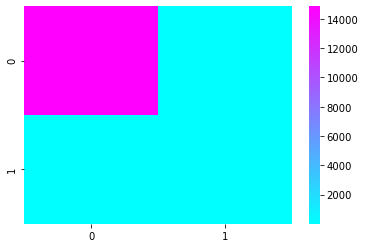

,0,1
0,14860,5
1,11,23


In [35]:
#Confusion matrix analysis code to check for missclassification rate for the SVM model

def con_matrix_analysis(svmc):
  x = svm_model.predict(X1)
  y = y1
  
  print(classification_report(y, x,
        target_names=['0','1']))

  con_matrix = pd.DataFrame(confusion_matrix(y, x), 
             columns=['0','1'], 
             index=['0','1'])
                            
  sns.heatmap(data=con_matrix, cmap='cool')
  plt.show();
  return con_matrix

con_matrix_analysis(svm_model)

## Calculating the desired and total CO2 emission values for city and highway data

In [36]:
##Calculating the desired and actual values of CO2 emissions for the entire trip of city data

    #Trip distance
Total_trip_distance = np.amax(df['Trip Distance(km)'])
print('Total trip distance in kms:' , Total_trip_distance)
    
    # Fuel for the trip
fuel_consumed_in_gal = np.amax(df['Fuel used (trip)(gal)'])
fuel_consumed_in_lit = fuel_consumed_in_gal * 3.78541
print('Total fuel consumed for the trip in lit:' , fuel_consumed_in_lit)

    #As per the estimates 8.887 kgs of CO2 is generated per gallon of gasoline
CO2_per_lit = 8.887/3.78541
CO2_for_trip = fuel_consumed_in_lit * CO2_per_lit
print('Desired CO2 generated for trip in kgs:', CO2_for_trip)

    #Calculating CO2 as per generated values
Avg_CO2_emission = np.mean(df['CO₂ in g/km (Average)'])
CO2_emitted = (Avg_CO2_emission * Total_trip_distance)/1000
print('Total CO2 emitted for the trip in kgs:' , CO2_emitted)

Total trip distance in kms: 52.21823883
Total fuel consumed for the trip in lit: 4.7532892181715996
Desired CO2 generated for trip in kgs: 11.159288236119998
Total CO2 emitted for the trip in kgs: 14.571950174191333


In [37]:
##Calculating the desired and actual values of CO2 emissions for the entire trip of Highway data
    
    #Trip ditance
Total_trip_distance = np.amax(highway_data['Trip Distance(km)'])
print('Total trip distance in kms:' , Total_trip_distance)
    
    # Fuel and CO2 for the trip
fuel_consumed_in_gal = np.amax(highway_data['Fuel used (trip)(gal)'])
fuel_consumed_in_lit = fuel_consumed_in_gal * 3.78541
print('Total fuel consumed for the trip in lit:' , fuel_consumed_in_lit)

    #As per the estimates 8.887 kgs of CO2 is generated per gallon of gasoline
CO2_per_lit = 8.887/3.78541
CO2_for_trip = fuel_consumed_in_lit * CO2_per_lit
print('Desired CO2 generated for trip in kgs:', CO2_for_trip)

    #Calculating CO2 as per generated values
Avg_CO2_emission = np.mean(highway_data['CO₂ in g/km (Average) '])
CO2_emitted = (Avg_CO2_emission * Total_trip_distance)/1000
print('Total CO2 emitted for the trip in kgs:' , CO2_emitted)

Total trip distance in kms: 52.19232178
Total fuel consumed for the trip in lit: 3.6156391311166
Desired CO2 generated for trip in kgs: 8.48842924762
Total CO2 emitted for the trip in kgs: 11.72902461746667


## Calculating the CO2 emissions and Fuel Consumptions at different irregularities for city data and plotting them on map

In [38]:
df.columns

Index(['Longitude', 'Latitude', 'GPS Speed (Meters/second)',
       ' Horizontal Dilution of Precision', ' Altitude', ' Bearing', ' G(x)',
       ' G(y)', ' G(z)', ' G(calibrated)', ' Absolute Throttle Position B(%)',
       'AccX', 'AccY', 'AccZ', 'Actual engine % torque(%)', 'Air Fuel Ratio',
       'Ambient air temp(°C)', 'Barometric pressure (from vehicle)(psi)',
       'CO₂ in g/km (Average)', 'CO₂ in g/km (Instantaneous)',
       'Engine Coolant Temperature(°C)', 'Engine Load(%)',
       'Engine Load(Absolute)(%)', 'Engine RPM', 'Fuel used (trip)(gal)',
       'GPS Latitude(°)', 'GPS Longitude(°)', 'GPS Satellites',
       'Intake Air Temperature(°C)', 'Intake Manifold Pressure(psi)',
       'Mass Air Flow Rate(g/s)', 'Speed (GPS)(km/h)', 'Speed (OBD)(km/h)',
       'Throttle Position(Manifold)(%)', 'Torque(Nm)', 'Trip Distance(km)',
       'Image_label', 'cluster', 'Pothole'],
      dtype='object')

In [39]:
#Removing the Zero values in the CO2 instantaneous values as at the potholes, series of these values become zero

df2 = df[(df[['CO₂ in g/km (Instantaneous)']] != 0).all(axis=1)]

In [40]:
df2.shape

(11392, 39)

In [41]:
#Taking the difference of each column to get the CO2 emission and fuel consumption at potholes

df2['CO2_diff'] = df2['CO₂ in g/km (Instantaneous)'].diff()
df2['fuel_diff'] = df2['Fuel used (trip)(gal)'].diff()

<ipython-input-41-511c5fbed493>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['CO2_diff'] = df2['CO₂ in g/km (Instantaneous)'].diff()
<ipython-input-41-511c5fbed493>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['fuel_diff'] = df2['Fuel used (trip)(gal)'].diff()


In [42]:
#Converting fuel values from gallons to liters

df2['fuel_diff'] = df2['fuel_diff'] * 3.78541

<ipython-input-42-6a9e287e489f>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['fuel_diff'] = df2['fuel_diff'] * 3.78541


In [43]:
x = df2['CO2_diff'].min()
x

-725.4024047899999

In [44]:
y = df2['CO2_diff'].max()
y

1573.1694030800002

In [45]:
z = np.mean([[x,y]])
z

423.88349914500014

In [46]:
#Considering the average value of the CO2 differences to filter out

df2 = df2[df2['CO2_diff']>z]

In [47]:
df2.to_csv("df2.csv")

In [48]:
#Grouping the dataset based on cluster values

group = df2.groupby('cluster')
group

In [49]:
for cluster, cluster_df in group:
    print(cluster)
    print(cluster_df)

0
        Longitude   Latitude  GPS Speed (Meters/second)  \
381   -104.583690  50.419807                       4.27   
2571  -104.626765  50.418651                       4.14   
4891  -104.636935  50.459783                       3.17   
5184  -104.635500  50.465345                       4.93   
5308  -104.635520  50.467632                       4.67   
6466  -104.620881  50.477054                       4.33   
7150  -104.597641  50.477013                       5.61   
8362  -104.557948  50.455167                       3.98   
9086  -104.542076  50.463399                       4.98   
9478  -104.548550  50.458324                       4.51   
10241 -104.531946  50.448931                       4.41   
11549 -104.590872  50.438657                       3.89   
12765 -104.600737  50.419408                       4.31   
13180 -104.596416  50.422071                       4.48   
13704 -104.603419  50.409206                       4.23   
14249 -104.613354  50.406532                       4.4

In [50]:
#Defining various dataframes based on the type of potholes

df_bigpothole = group.get_group(0)
df_bigpothole.to_csv('df_bigpothole.csv')
df_mediumpothole = group.get_group(1)
df_mediumpothole.to_csv('df_mediumpothole.csv')
df_smallbump = group.get_group(2)
df_smallbump.to_csv('df_smallbump.csv')
df_heavybump = group.get_group(3)
df_heavybump.to_csv('df_heavybump.csv')

In [51]:
#Getting the maximum and minimum values of Latitude and Longitude for map

BBox = (df[['Longitude']].min().to_numpy()[0], df[['Longitude']].max().to_numpy()[0],      
         df[['Latitude']].min().to_numpy()[0], df[['Latitude']].max().to_numpy()[0])
BBox

(-104.64091945, -104.52792334, 50.4013244, 50.47882418)

In [52]:
#Average fuel consumption for the car 

Avg_fuel_consumption = Total_trip_distance/fuel_consumed_in_lit
print('Average fuel consumption of car in kms/lit : ', Avg_fuel_consumption)

Average fuel consumption of car in kms/lit :  14.43515790357145


Average CO2 at big potholes in gms/lit :  812.6255627788235
Total fuel consumed at big potholes in lit:  0.08420175154160266
CO2 emitted at big potholes in kgs :  0.9877184003847105


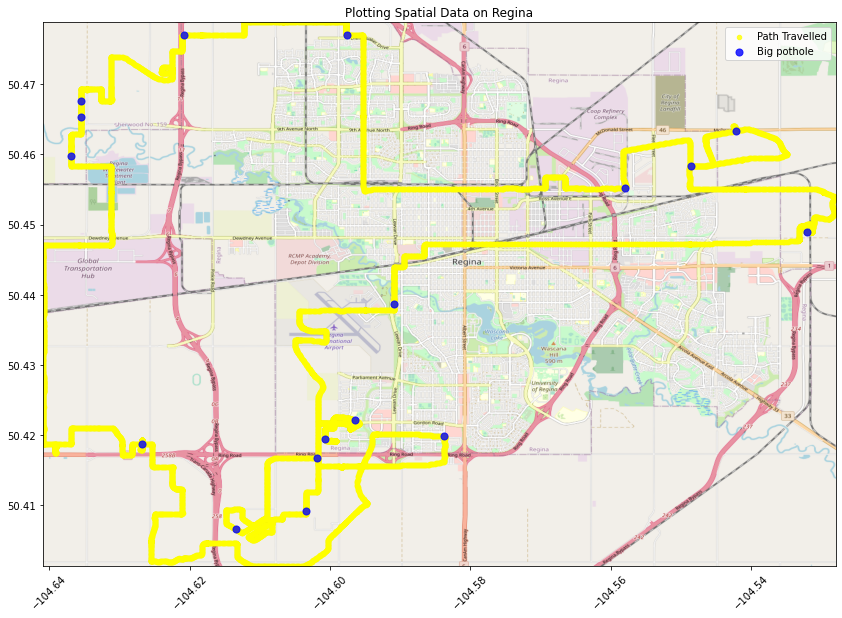

In [53]:
#Caluculating the Fuel Consumed and CO2 emissions at the big potholes and plotting them on map

Avg_CO2_0 = df_bigpothole['CO2_diff'].mean()
Total_fuel_0 = df_bigpothole['fuel_diff'].sum()
distance_at_0 = Avg_fuel_consumption * Total_fuel_0
CO2_emitted_at_0 = (Avg_CO2_0 * distance_at_0)/1000
print('Average CO2 at big potholes in gms/lit : ' , Avg_CO2_0)
print('Total fuel consumed at big potholes in lit: ' , Total_fuel_0)
print('CO2 emitted at big potholes in kgs : ', CO2_emitted_at_0)

map = plt.imread('map.png')
fig, ax = plt.subplots(figsize = (40,10))
ax.scatter(df[['Longitude']], df[['Latitude']], zorder=1, alpha= 0.8, c='yellow', s=20)
ax.scatter(df_bigpothole[['Longitude']], df_bigpothole[['Latitude']], zorder=1, alpha= 0.8, c='b', s=50)
plt.legend(["Path Travelled" , "Big pothole"])
ax.set_title('Plotting Spatial Data on Regina')

ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])

ax.imshow(map, zorder=0, extent = BBox, aspect= 'equal')
plt.xticks(rotation=45);

Average CO2 at medium potholes in gms/lit :  776.3646443688334
Total fuel consumed at medium potholes in lit:  0.3776781914986997
CO2 emitted at medium potholes in kgs :  4.232619185205827


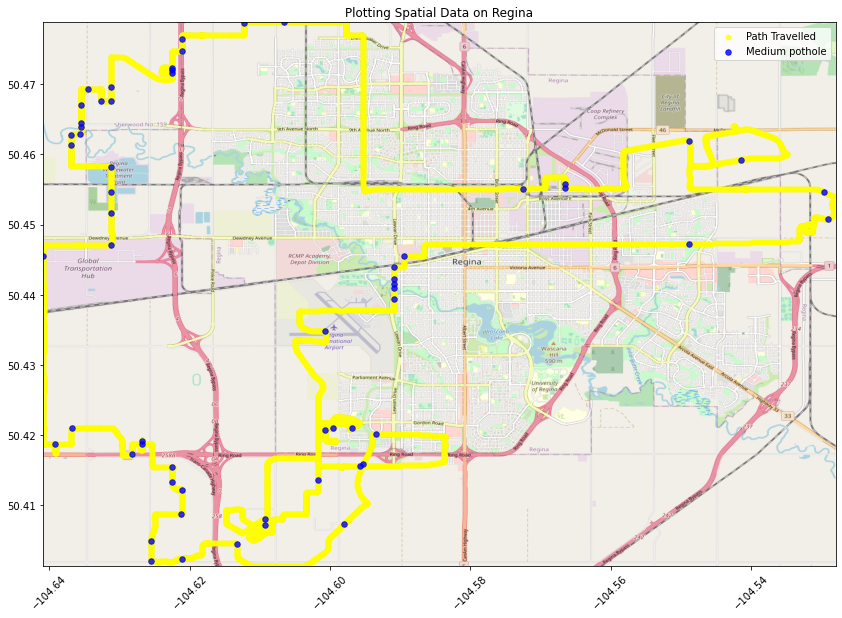

In [54]:
#Caluculating the Fuel Consumed and CO2 emissions at the Medium potholes and plotting them on map

Avg_CO2_1 = df_mediumpothole['CO2_diff'].mean()
Total_fuel_1 = df_mediumpothole['fuel_diff'].sum()
distance_at_1 = Avg_fuel_consumption * Total_fuel_1
CO2_emitted_at_1 = (Avg_CO2_1 * distance_at_1)/1000
print('Average CO2 at medium potholes in gms/lit : ' , Avg_CO2_1)
print('Total fuel consumed at medium potholes in lit: ' , Total_fuel_1)
print('CO2 emitted at medium potholes in kgs : ', CO2_emitted_at_1)

map = plt.imread('map.png')
fig, ax = plt.subplots(figsize = (40,10))
ax.scatter(df[['Longitude']], df[['Latitude']], zorder=1, alpha= 0.8, c='yellow', s=20)
ax.scatter(df_mediumpothole[['Longitude']], df_mediumpothole[['Latitude']], zorder=1, alpha= 0.8, c='b', s=30)
ax.set_title('Plotting Spatial Data on Regina')
plt.legend(["Path Travelled" , "Medium pothole"])


ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])

ax.imshow(map, zorder=0, extent = BBox, aspect= 'equal')
plt.xticks(rotation=45);

Average CO2 at small bumps in gms/lit :  813.2153479731344
Total fuel consumed at small bumps in lit:  0.37291512365799856
CO2 emitted at small bumps in kgs :  4.377610345976288


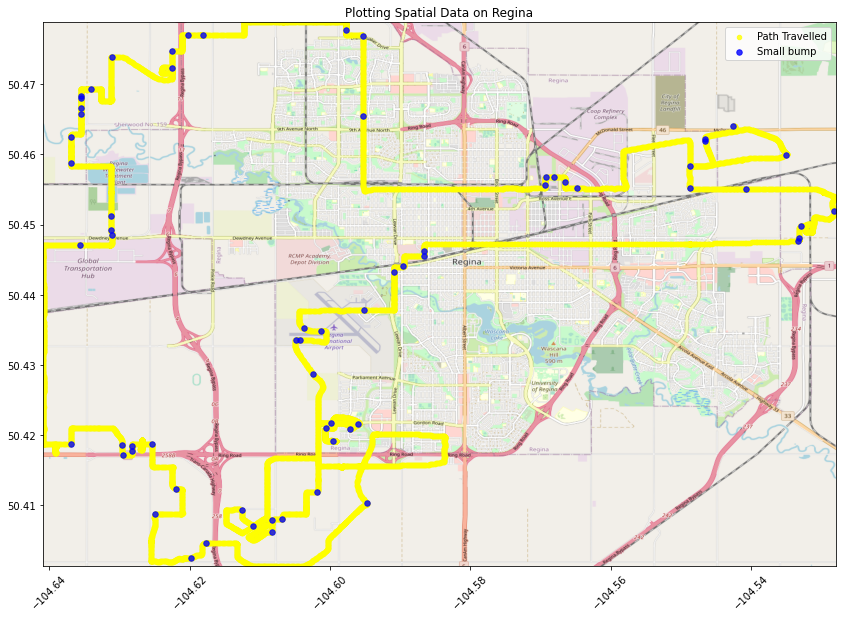

In [55]:
#Caluculating the Fuel Consumed and CO2 emissions at the Small bump and plotting them on map

Avg_CO2_2 = df_smallbump['CO2_diff'].mean()
Total_fuel_2 = df_smallbump['fuel_diff'].sum()
distance_at_2 = Avg_fuel_consumption * Total_fuel_2
CO2_emitted_at_2 = (Avg_CO2_2 * distance_at_2)/1000
print('Average CO2 at small bumps in gms/lit : ' , Avg_CO2_2)
print('Total fuel consumed at small bumps in lit: ' , Total_fuel_2)
print('CO2 emitted at small bumps in kgs : ', CO2_emitted_at_2)

map = plt.imread('map.png')
fig, ax = plt.subplots(figsize = (40,10))
ax.scatter(df[['Longitude']], df[['Latitude']], zorder=1, alpha= 0.8, c='yellow', s=20)
ax.scatter(df_smallbump[['Longitude']], df_smallbump[['Latitude']], zorder=1, alpha= 0.8, c='b', s=30)
ax.set_title('Plotting Spatial Data on Regina')
plt.legend(["Path Travelled" , "Small bump"])

ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])

ax.imshow(map, zorder=0, extent = BBox, aspect= 'equal')
plt.xticks(rotation=45);

Average CO2 at heavy bumps in gms/lit :  834.95459175
Total fuel consumed at heavy bumps in lit:  0.04295959602930053
CO2 emitted at heavy bumps in kgs :  0.5177791820984277


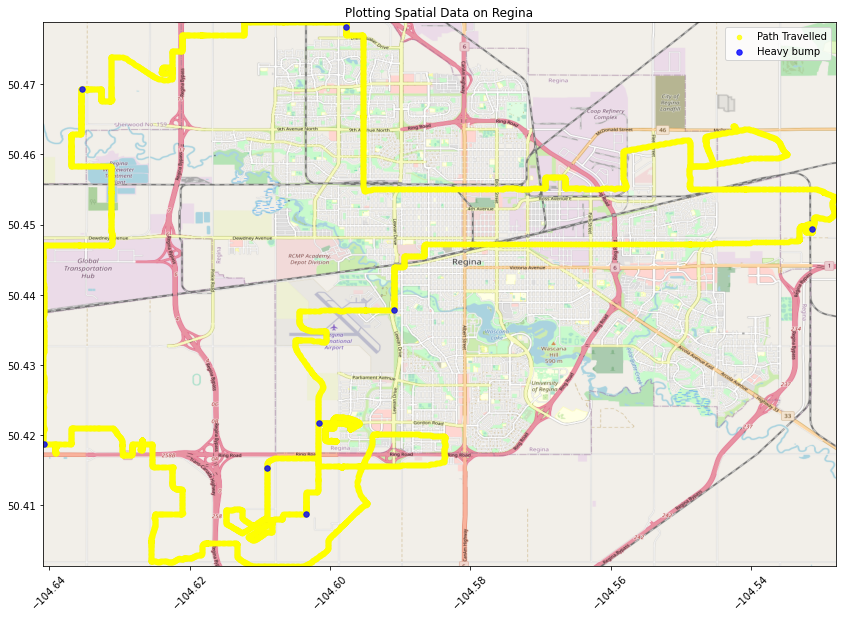

In [56]:
#Caluculating the Fuel Consumed and CO2 emissions at the Heavy bump and plotting them on map

Avg_CO2_3 = df_heavybump['CO2_diff'].mean()
Total_fuel_3 = df_heavybump['fuel_diff'].sum()
distance_at_3 = Avg_fuel_consumption * Total_fuel_3
CO2_emitted_at_3 = (Avg_CO2_3 * distance_at_3)/1000
print('Average CO2 at heavy bumps in gms/lit : ' , Avg_CO2_3)
print('Total fuel consumed at heavy bumps in lit: ' , Total_fuel_3)
print('CO2 emitted at heavy bumps in kgs : ', CO2_emitted_at_3)

map = plt.imread('map.png')
fig, ax = plt.subplots(figsize = (40,10))
ax.scatter(df[['Longitude']], df[['Latitude']], zorder=1, alpha= 0.8, c='yellow', s=20)
ax.scatter(df_heavybump[['Longitude']], df_heavybump[['Latitude']], zorder=1, alpha= 0.8, c='b', s=30)
ax.set_title('Plotting Spatial Data on Regina')
plt.legend(["Path Travelled" , "Heavy bump"])

ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])

ax.imshow(map, zorder=0, extent = BBox, aspect= 'equal')
plt.xticks(rotation=45);

In [57]:
#Cumulative results of CO2 and fuel at all irregularities

Total_fuel_at_irregularities = Total_fuel_0 + Total_fuel_1 + Total_fuel_2 + Total_fuel_3
Total_CO2_at_irregularities = CO2_emitted_at_0 + CO2_emitted_at_1 + CO2_emitted_at_2 + CO2_emitted_at_3
print('Total fuel consumed at irregularities in lit :', Total_fuel_at_irregularities)
print('Total CO2 emitted at irregularities in kgs : ', Total_CO2_at_irregularities )

Total fuel consumed at irregularities in lit : 0.8777546627276014
Total CO2 emitted at irregularities in kgs :  10.115727113665253


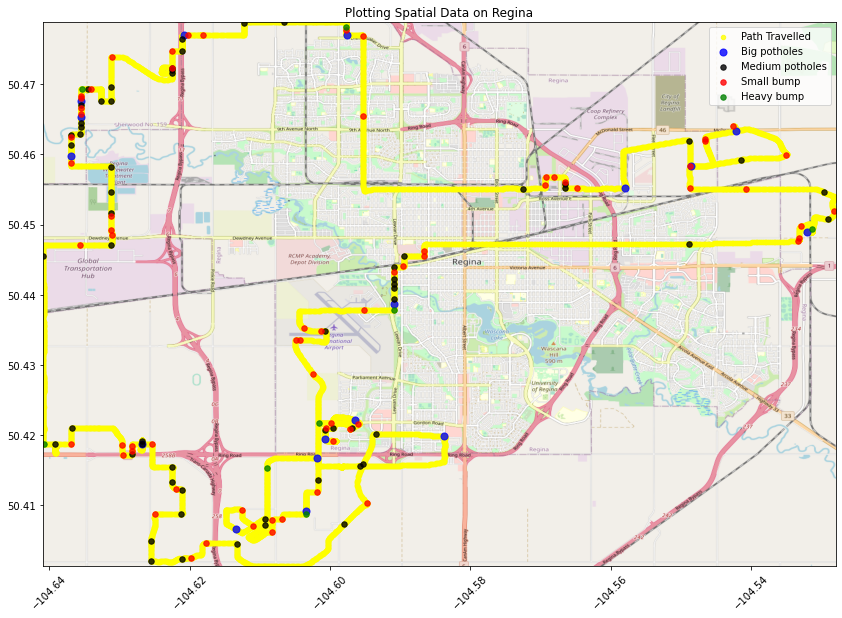

In [58]:
#Plotting all irregularities on the map

map = plt.imread('map.png')
fig, ax = plt.subplots(figsize = (40,10))

ax.scatter(df[['Longitude']], df[['Latitude']], zorder=1, alpha= 0.8, c='yellow', s=20)
ax.scatter(df_bigpothole[['Longitude']], df_bigpothole[['Latitude']], zorder=1, alpha= 0.8, c='b', s=50)
ax.scatter(df_mediumpothole[['Longitude']], df_mediumpothole[['Latitude']], zorder=1, alpha= 0.8, c='black', s=30)
ax.scatter(df_smallbump[['Longitude']], df_smallbump[['Latitude']], zorder=1, alpha= 0.8, c='red', s=30)
ax.scatter(df_heavybump[['Longitude']], df_heavybump[['Latitude']], zorder=1, alpha= 0.8, c='green', s=30)
ax.set_title('Plotting Spatial Data on Regina')
plt.legend(["Path Travelled" , "Big potholes", "Medium potholes" , "Small bump" , "Heavy bump"])

ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])

ax.imshow(map, zorder=0, extent = BBox, aspect= 'equal')
plt.xticks(rotation=45);

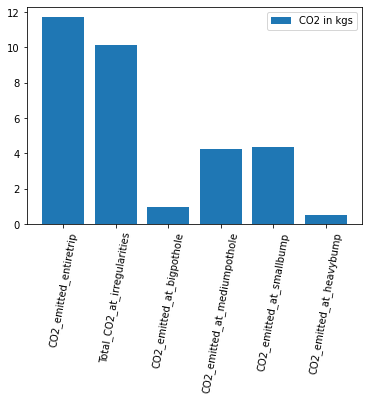

In [59]:
# CO2 emissions plot

CO2_values = [CO2_emitted , Total_CO2_at_irregularities, CO2_emitted_at_0 , CO2_emitted_at_1 , CO2_emitted_at_2, CO2_emitted_at_3]
CO2_array = [ "CO2_emitted_entiretrip" ,"Total_CO2_at_irregularities", "CO2_emitted_at_bigpothole" , "CO2_emitted_at_mediumpothole" , "CO2_emitted_at_smallbump", "CO2_emitted_at_heavybump"]

plt.bar(CO2_array, CO2_values , label = "CO2 in kgs")
plt.legend()
plt.xticks(rotation=80);

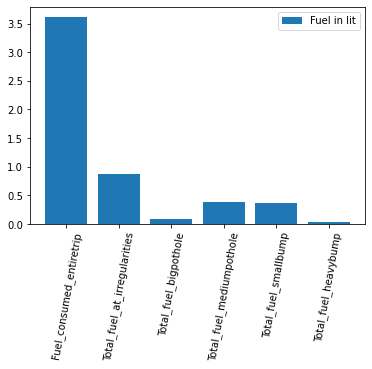

In [60]:
# Fuel consumed plot

fuel_values = [fuel_consumed_in_lit, Total_fuel_at_irregularities , Total_fuel_0, Total_fuel_1, Total_fuel_2, Total_fuel_3]
fuel_array = ["Fuel_consumed_entiretrip","Total_fuel_at_irregularities" , "Total_fuel_bigpothole", "Total_fuel_mediumpothole", "Total_fuel_smallbump", "Total_fuel_heavybump"]

plt.bar(fuel_array, fuel_values , label = "Fuel in lit")
plt.legend()
plt.xticks(rotation=80);